# Introduction

Hi, I'm Dinda Tirta. Here is my notebook as the result of the technical test Data Scientist.

#The problem

I am trying to analyze what the problem is from the given dataset. I assume a risk flag with the aim of seeing **the potential borrower** in a lending institution (can be *peer to peer or bank*) is eligible or not to become a borrower.

In lending institutions (the p2p or banks) the readiness of borrower candidates greatly influences the smoothness of loan installment payments. **We are trying to minimize non-performing loans (NPL)**. This dataset helps us to see which features have an effect on determining the borrower candidate on the probability of the occurrence of NPL.

**We are here trying to build a model that can predict whether the borrower would deafult on their loans or not.**

# Calling the libraries

In [12]:
!pip install --upgrade plotly

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import make_pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_auc_score
from sklearn.model_selection import GridSearchCV, cross_val_score

from keras.utils import np_utils
from keras.layers import Dense, Dropout, BatchNormalization
import tensorflow as tf
import keras
from keras.callbacks import EarlyStopping

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Dataset

In [3]:
data = pd.read_csv('/content/drive/MyDrive/loan/LoanDefaultData.csv')
print(data.info())
data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 252000 entries, 0 to 251999
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   Id                 252000 non-null  int64 
 1   Income             252000 non-null  int64 
 2   Age                252000 non-null  int64 
 3   Experience         252000 non-null  int64 
 4   Married/Single     252000 non-null  object
 5   House_Ownership    252000 non-null  object
 6   Car_Ownership      252000 non-null  object
 7   Profession         252000 non-null  object
 8   CITY               252000 non-null  object
 9   STATE              252000 non-null  object
 10  CURRENT_JOB_YRS    252000 non-null  int64 
 11  CURRENT_HOUSE_YRS  252000 non-null  int64 
 12  Risk_Flag          252000 non-null  int64 
dtypes: int64(7), object(6)
memory usage: 25.0+ MB
None


,Id,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,Risk_Flag
0,1,1303834,23,3,single,rented,no,Mechanical_engineer,Rewa,Madhya_Pradesh,3,13,0
1,2,7574516,40,10,single,rented,no,Software_Developer,Parbhani,Maharashtra,9,13,0
2,3,3991815,66,4,married,rented,no,Technical_writer,Alappuzha,Kerala,4,10,0
3,4,6256451,41,2,single,rented,yes,Software_Developer,Bhubaneswar,Odisha,2,12,1
4,5,5768871,47,11,single,rented,no,Civil_servant,Tiruchirappalli[10],Tamil_Nadu,3,14,1


# Data Cleaning

In [4]:
print(f'There are {data.isna().any().sum()} columns with missing values in dataset.')
data.isna().sum()

There are 0 columns with missing values in dataset.


Id                   0
Income               0
Age                  0
Experience           0
Married/Single       0
House_Ownership      0
Car_Ownership        0
Profession           0
CITY                 0
STATE                0
CURRENT_JOB_YRS      0
CURRENT_HOUSE_YRS    0
Risk_Flag            0
dtype: int64

Dataset has no any missing values.

In [5]:
# convert data columns title into lowercase 
data.columns = data.columns.str.lower()
data.columns

Index(['id', 'income', 'age', 'experience', 'married/single',
       'house_ownership', 'car_ownership', 'profession', 'city', 'state',
       'current_job_yrs', 'current_house_yrs', 'risk_flag'],
      dtype='object')

Here we try to convert the title of columns into lowecase to make it easier when we use that columns.

In [6]:
# remove special characters in city column values

data['city']=data['city'].str.extract('(\w+\s\w+[^0-9]|\w+[^0-9])')

**City column contains numbers and special characters that unnecessary.** So, here we remove it using regex.

In [7]:
data['city'].values

array(['Rewa', 'Parbhani', 'Alappuzha', ..., 'Kalyan-', 'Pondicherry',
       'Avadi'], dtype=object)

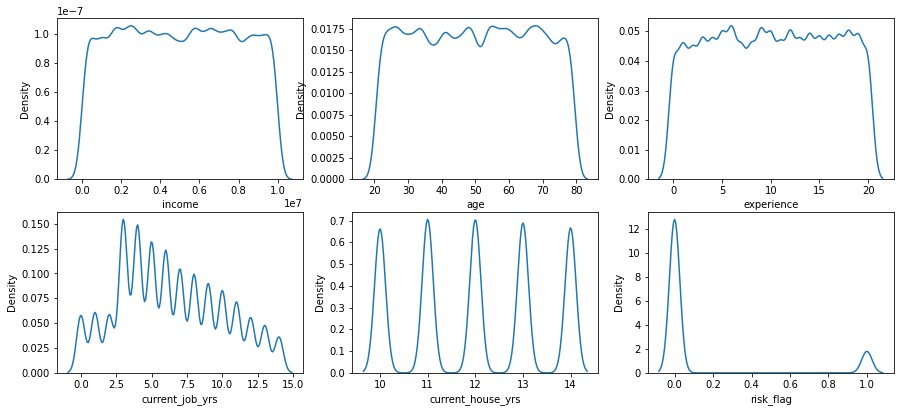

In [8]:
# Distribution our dataset

num_cols = ['income', 'age', 'experience', 'current_job_yrs', 'current_house_yrs', 'risk_flag']

plt.figure(figsize=(15,35))
for k, num_cols in enumerate(data[num_cols]):
    ax = plt.subplot(10, 3, k+1)
    sns.kdeplot(data[num_cols], ax=ax)
plt.show()

In [9]:
data.describe()

,id,income,age,experience,current_job_yrs,current_house_yrs,risk_flag
count,252000.000000,2.520000e+05,252000.000000,252000.000000,252000.000000,252000.000000,252000.000000
mean,126000.500000,4.997117e+06,49.954071,10.084437,6.333877,11.997794,0.123000
std,72746.278255,2.878311e+06,17.063855,6.002590,3.647053,1.399037,0.328438
min,1.000000,1.031000e+04,21.000000,0.000000,0.000000,10.000000,0.000000
25%,63000.750000,2.503015e+06,35.000000,5.000000,3.000000,11.000000,0.000000
50%,126000.500000,5.000694e+06,50.000000,10.000000,6.000000,12.000000,0.000000
75%,189000.250000,7.477502e+06,65.000000,15.000000,9.000000,13.000000,0.000000
max,252000.000000,9.999938e+06,79.000000,20.000000,14.000000,14.000000,1.000000


In [10]:
#mode values
for i in data.select_dtypes('number'):
    print(f'{i}', "mode is", data[i].mode()[0])

id mode is 1
income mode is 7936020
age mode is 27
experience mode is 6
current_job_yrs mode is 3
current_house_yrs mode is 11
risk_flag mode is 0


### Summary 

1. We can see from the overall number features that the mean and mode values ​​are close together. So that all these features can be said to have a normal distribution.

2. The value in the income column is very far from the value of other features. Needs to be scaled during preprocessing.

3. Based on the density graph above, we can confirm that the features **have no outliers.**

# Exploratory Data Analysis

In [11]:
#job count dataframe
data_job = pd.DataFrame(data['profession'].value_counts().reset_index())
data_job = data_job.rename(columns={
    'index' : 'jobs',
    'profession' : 'count'
})



In [13]:
def treemap_case(train_set,variable,value):
    fig = px.treemap(train_set.sort_values(by=value, ascending=False).reset_index(drop=True),
                  path=[variable], values=value, title=('Number of Profession according to Our Sample Population ' 
                     + str(variable) + ' in ' +str(value) + "<br>"),
                     color_discrete_sequence = px.colors.qualitative.Set2)
    fig.data[0].textinfo = 'label+text+value'
    fig.show()

    
treemap_case(data_job, "jobs", "count")


From the distribution table above, we can see that the highest profession distribution is in the physician profession with a total of 5957. While the lowest is in the borrower with the Engineer profession with a total of 4048.

The profession distribution of borrower has a close gap between the professions with the lowest and highest number.

In [14]:
fig = plt.Figure(figsize=(8,8))
fig = px.histogram(data, x="profession", color='risk_flag', color_discrete_sequence=px.colors.qualitative.Pastel,
                  title='Distribution between Profession to Default on Loan <br>')
fig.update_layout(autosize=None,
                 width = 600,
                 height = 500,
                 xaxis=dict(
                 title_text='Profession',
                 titlefont=dict(size=14)),
                  
                 yaxis=dict(
                 title_text='Risk Flag for Loan',
                 titlefont=dict(size=14)),
                paper_bgcolor='rgb(224,255,246)',
                plot_bgcolor='#fff'
)

fig.show()

We can see in the graph above, the borrower with the highest default is in the Pollice Officer profession with a total of 826 cases. Meanwhile, the lowest default was in the Technology Specialist profession with a total of 386 cases.

**For borrowers who did not default, the highest was in the Physhian profession with a total of 5247 cases. So that this profession can be a good potential for marketing the next loan offer.**

In [15]:
fig = px.box(data, x="profession", y="age", points="all", color='risk_flag', title='Distribution of Default on Loan <br> <i>(By Profession and Age)</i>'
            ,color_discrete_sequence=px.colors.qualitative.Dark24)
fig.update_layout(autosize=None,
                 width = 800,
                 height = 600,
                 xaxis=dict(
                 title_text='Occupation',
                 titlefont=dict(size=14)),
                  
                 yaxis=dict(
                 title_text='Age',
                 titlefont=dict(size=14)),
                paper_bgcolor='rgb(224,255,246)',
                plot_bgcolor='#fff'
)
fig.show()

Based on the graph above, the age distribution of borrowers is very even. With a range between the ages of 20 - 80 years.

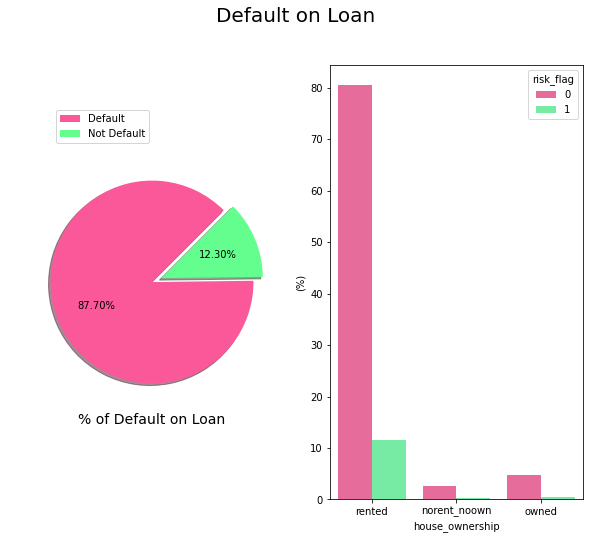

In [16]:
f, ax = plt.subplots(1,2, figsize=(10,8))

colors = ["#FA5898", "#64FE8E"]
labels = ["Default", "Not Default"]

plt.suptitle('Default on Loan', fontsize=20)

data["risk_flag"].value_counts().plot.pie(explode=[0,0.10], autopct='%1.2f%%', ax=ax[0], shadow=True, colors=colors, labels=None,
                                            fontsize=10, startangle=45)
#explode=jarak antara potongan pie
#auto angka di belakang koma
ax[0].set_xlabel('% of Default on Loan', fontsize=14)
ax[0].set_ylabel(' ', fontsize=14)
ax[0].legend(labels, loc='upper left', bbox_to_anchor=(0.1, 1.2))

##barplot
palette = ["#FA5898", "#64FE9E"]

sns.barplot(x="house_ownership", y="income", hue="risk_flag", data=data, palette=palette, estimator=lambda x: len(x) / len(data) * 100)
ax[1].set(ylabel="(%)")
ax[1].set_xticklabels(data["house_ownership"].unique(), rotation=0, rotation_mode="anchor")
plt.show()

Based on the graph above, we can see that the distribution of borrowers who default and those who do not default is imbalance.

**Those who default and do not default are the borrowers with the status of rented house ownership.**

In [17]:
flag_1 = data[data['risk_flag']==1].groupby('city')[['risk_flag']].count().reset_index().sort_values(by='risk_flag', ascending=False)[:5]
flag_0 = data[data['risk_flag']==0].groupby('city')[['risk_flag']].count().reset_index().sort_values(by='risk_flag', ascending=False)[:5]

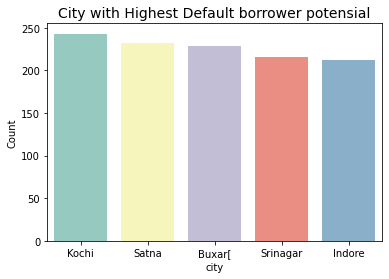

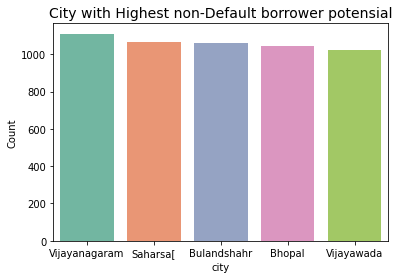

In [18]:
# distribution city by risk flag 1
sns.barplot(data=flag_1, x="city", y="risk_flag", palette='Set3')
plt.title('City with Highest Default borrower potensial', fontsize=14)
plt.ylabel('Count')
plt.show()

# distribution city by risk flag 0
sns.barplot(data=flag_0, x="city", y="risk_flag", palette='Set2')
plt.title('City with Highest non-Default borrower potensial', fontsize=14)
plt.ylabel('Count')
plt.show()

Based on the graph above, the cities that have the highest potential defaults are the cities of Kochi, Satna, Buxar, Srinagar, and Indore.

Meanwhile, the potential for cities that do not default are Vijayanagaram, Saharsa, Bulandshar, Bhopal and Vijawada.

# Feature Engineering

In [19]:
data = data.drop(['id', 'state'], axis=1)

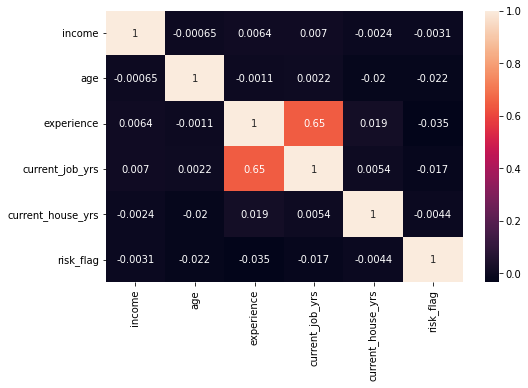

In [20]:
#Pearson corr method to see linear correlation between feature to other feature and feature to label
plt.figure(figsize=(8,5))
sns.heatmap(data.corr(method='pearson'), annot=True)
plt.show()

In [21]:
data = data.drop(['experience'], axis=1)

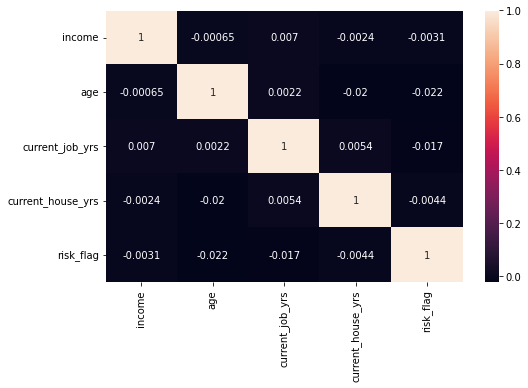

In [22]:
# corr method to see linear correlation between feature to other feature and feature to label
plt.figure(figsize=(8,5))
sns.heatmap(data.corr(method='pearson'), annot=True)
plt.show()

In [23]:
#VIF
num_features = data.select_dtypes('number').drop(['risk_flag'],axis=1)
vif_data = pd.DataFrame()
vif_data['feature'] = num_features.columns
vif_data['VIF'] = [variance_inflation_factor(num_features.values, i) for i in range(len(num_features.columns))]
vif_data

,feature,VIF
0,income,3.878310
1,age,8.553493
2,current_job_yrs,3.891922
3,current_house_yrs,12.873045


In [24]:
cat_cols = data.select_dtypes('object')
cat_cols.columns

Index(['married/single', 'house_ownership', 'car_ownership', 'profession',
       'city'],
      dtype='object')

In [25]:
# creating instance of one-hot-encoder
enc = OneHotEncoder(handle_unknown='ignore')
# passing bridge-types-cat column (label encoded values of bridge_types)
cols = ['married/single', 'house_ownership', 'car_ownership', 'profession',
       'city']
encoded_features = enc.fit(data[cols])
encoded_features = enc.transform(data[cols])

s = encoded_features.toarray()
print(s)
ohe_df = pd.DataFrame(s, columns=enc.get_feature_names())
data_train = data.drop(['married/single', 'house_ownership', 'car_ownership', 'profession',
       'city'], axis=1)
data_train = data_train.reset_index()
data_train = data_train.drop(['index'], axis=1)
data_train = data_train.join(ohe_df)
data_train

[[0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]


,income,age,current_job_yrs,current_house_yrs,risk_flag,x0_married,x0_single,x1_norent_noown,x1_owned,x1_rented,x2_no,x2_yes,x3_Air_traffic_controller,x3_Analyst,x3_Architect,x3_Army_officer,x3_Artist,x3_Aviator,x3_Biomedical_Engineer,x3_Chartered_Accountant,x3_Chef,x3_Chemical_engineer,x3_Civil_engineer,x3_Civil_servant,x3_Comedian,x3_Computer_hardware_engineer,x3_Computer_operator,x3_Consultant,x3_Dentist,x3_Design_Engineer,x3_Designer,x3_Drafter,x3_Economist,x3_Engineer,x3_Fashion_Designer,x3_Financial_Analyst,x3_Firefighter,x3_Flight_attendant,x3_Geologist,x3_Graphic_Designer,...,x4_Sonipat,x4_South_Dumdum,x4_Sri_Ganganagar,x4_Srikakulam,x4_Srinagar,x4_Sultan_Pur_Majra,x4_Surat,x4_Surendranagar_Dudhrej,x4_Suryapet,x4_Tadepalligudem,x4_Tadipatri,x4_Tenali,x4_Tezpur,x4_Thane,x4_Thanjavur,x4_Thiruvananthapuram,x4_Thoothukudi,x4_Thrissur,x4_Tinsukia,x4_Tiruchirappalli[,x4_Tirunelveli,x4_Tirupati[,x4_Tiruppur,x4_Tiruvottiyur,x4_Tumkur,x4_Udaipur,x4_Udupi,x4_Ujjain,x4_Ulhasnagar,x4_Uluberia,x4_Unnao,x4_Vadodara,x4_Varanasi,x4_Vasai-,x4_Vellore,x4_Vijayanagaram,x4_Vijayawada,x4_Visakhapatnam[,x4_Warangal[,x4_Yamunanagar
0,1303834,23,3,13,0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,7574516,40,9,13,0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3991815,66,4,10,0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,6256451,41,2,12,1,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5768871,47,3,14,1,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
251995,8154883,43,6,11,0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
251996,2843572,26,6,11,0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
251997,4522448,46,7,12,0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.

In [26]:
data_train.columns

Index(['income', 'age', 'current_job_yrs', 'current_house_yrs', 'risk_flag',
       'x0_married', 'x0_single', 'x1_norent_noown', 'x1_owned', 'x1_rented',
       ...
       'x4_Unnao', 'x4_Vadodara', 'x4_Varanasi', 'x4_Vasai-', 'x4_Vellore',
       'x4_Vijayanagaram', 'x4_Vijayawada', 'x4_Visakhapatnam[',
       'x4_Warangal[', 'x4_Yamunanagar'],
      dtype='object', length=380)

In [27]:
import re

regex = re.compile(r"\[|\]|<", re.IGNORECASE)

data_train.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in data_train.columns.values]

In [28]:
# define x_train and y_train
X = data_train.drop(['risk_flag'], axis=1)
y = data_train['risk_flag']

# set aside 20% of train and test data for evaluation
X_train, X_test, y_train, y_test = train_test_split(X, y,
    test_size=0.2, shuffle = True, random_state = 8)

# Use the same function above for the validation set
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, 
    test_size=0.25, random_state= 10) # 0.25 x 0.8 = 0.2


print("X_train shape: {}".format(X_train.shape))
print("y_train shape: {}".format(y_train.shape))
print("X_test shape: {}".format(X_test.shape))
print("y_test shape: {}".format(y_test.shape))
print("X_val shape: {}".format(X_val.shape))
print("y val shape: {}".format(y_val.shape))

X_train shape: (151200, 379)
y_train shape: (151200,)
X_test shape: (50400, 379)
y_test shape: (50400,)
X_val shape: (50400, 379)
y val shape: (50400,)


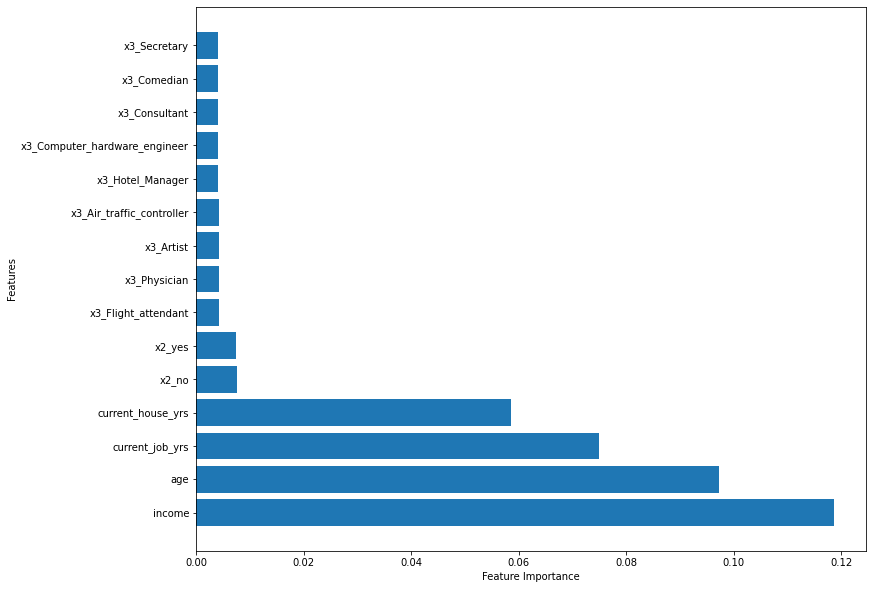

In [29]:
# print the feature importance

rnd_clf = RandomForestClassifier()
rnd_clf.fit(X_train, y_train)

features = X_train.columns
feature_imp = rnd_clf.feature_importances_

feat_imp_df = pd.DataFrame({'Features' : features, 'Feature_Importance' : feature_imp}).sort_values(by='Feature_Importance', ascending=False)

# Plot the feature_importance : only top 10
plt.figure(figsize=(12,10))
plt.barh(y=feat_imp_df['Features'].iloc[ :15], width=feat_imp_df['Feature_Importance'].iloc[ :15])
plt.xlabel("Feature Importance")
plt.ylabel("Features")
plt.show()

In [30]:
feat_imp_df['Features'][:15].values

array(['income', 'age', 'current_job_yrs', 'current_house_yrs', 'x2_no',
       'x2_yes', 'x3_Flight_attendant', 'x3_Physician', 'x3_Artist',
       'x3_Air_traffic_controller', 'x3_Hotel_Manager',
       'x3_Computer_hardware_engineer', 'x3_Consultant', 'x3_Comedian',
       'x3_Secretary'], dtype=object)

In [31]:
data_train = data_train[['income', 'age', 'current_job_yrs', 'current_house_yrs', 'x2_yes',
       'x2_no', 'x3_Physician', 'x3_Air_traffic_controller',
       'x3_Technical_writer', 'x3_Secretary', 'x0_married',
       'x3_Flight_attendant', 'x3_Artist', 'x0_single', 'x3_Psychologist', 'risk_flag']]
data_train

,income,age,current_job_yrs,current_house_yrs,x2_yes,x2_no,x3_Physician,x3_Air_traffic_controller,x3_Technical_writer,x3_Secretary,x0_married,x3_Flight_attendant,x3_Artist,x0_single,x3_Psychologist,risk_flag
0,1303834,23,3,13,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
1,7574516,40,9,13,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
2,3991815,66,4,10,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0
3,6256451,41,2,12,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1
4,5768871,47,3,14,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
251995,8154883,43,6,11,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
251996,2843572,26,6,11,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
251997,4522448,46,7,12,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
251998,6507128,45,0,10,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0


# Data Preprocessing

In [32]:
# define x_train and y_train
X = data_train.drop(['risk_flag'], axis=1)
y = data_train['risk_flag']

# set aside 20% of train and test data for evaluation
X_train, X_test, y_train, y_test = train_test_split(X, y,
    test_size=0.2, shuffle = True, random_state = 8)

# Use the same function above for the validation set
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, 
    test_size=0.25, random_state= 10) # 0.25 x 0.8 = 0.2


print("X_train shape: {}".format(X_train.shape))
print("y_train shape: {}".format(y_train.shape))
print("X_test shape: {}".format(X_test.shape))
print("y_test shape: {}".format(y_test.shape))
print("X_val shape: {}".format(X_val.shape))
print("y val shape: {}".format(y_val.shape))

X_train shape: (151200, 15)
y_train shape: (151200,)
X_test shape: (50400, 15)
y_test shape: (50400,)
X_val shape: (50400, 15)
y val shape: (50400,)


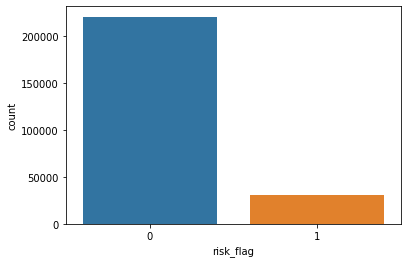

In [33]:
sns.countplot(data_train['risk_flag'])

As we can see, the class is imbalance.

In [34]:
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()
ss.fit(X_train)
X_train = ss.transform(X_train)
X_test = ss.transform(X_test)

In [35]:
from imblearn.over_sampling import SMOTE
from collections import Counter

counter = Counter(y_train)
print('Before :', counter)

#Oversampling of the dataset using SMOTE
smt = SMOTE()
X_smote, y_smote = smt.fit_resample(X_train, y_train)

counter = Counter(y_smote)
print('After :', counter)

Before : Counter({0: 132616, 1: 18584})
After : Counter({0: 132616, 1: 132616})


We need to SMOTE on the imbalance class. So that the monority class is more highlighted.

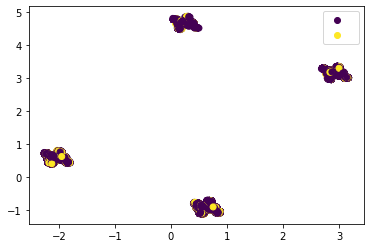

In [36]:

from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
data_train_x = data_train.drop(['risk_flag'], axis=1)
data_train_y = data_train['risk_flag']
pca = PCA(n_components=0.90)
pipe = Pipeline([('scaler', StandardScaler()), ('pca', pca)])
Xt = pipe.fit_transform(data_train_x)
plot = plt.scatter(Xt[:,0], Xt[:,1], c=data_train_y)
plt.legend(handles=plot.legend_elements()[0])
plt.show()

# Model Iterations

Contains Model Building and Model Evaluation in each algorithms

In [37]:
#Random forest classifier

rnd_clf = RandomForestClassifier(random_state=42) 
rnd_clf.fit(X_smote, y_smote)

y_pred_rf = rnd_clf.predict(X_test)

In [38]:
#Random forest classifier
print(accuracy_score(y_test, y_pred_rf))

0.8841269841269841


In [39]:
#XGBoost classifier

xgb_clf = XGBClassifier(random_state=42)
xgb_clf.fit(X_smote, y_smote)
y_pred_xgb = xgb_clf.predict(X_test)
y_pred_xgb

array([0, 1, 0, ..., 1, 1, 1])

In [40]:
#XGBoost classifier
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, y_pred_xgb))

0.6838888888888889


In [41]:
# Logistic regression

lr = LogisticRegression()
lr.fit(X_smote, y_smote)

y_pred_lr = lr.predict(X_test)
y_pred_lr

array([1, 0, 0, ..., 1, 1, 1])

In [42]:
#Logistic Regression
print(accuracy_score(y_test, y_pred_lr))

0.49565476190476193


In [43]:
# Voting classifier

log_clf = LogisticRegression(solver="lbfgs", random_state=42)
rnd_clf = RandomForestClassifier(n_estimators=100, random_state=42)

voting_clf = VotingClassifier(
    estimators=[('lr', log_clf), ('rf', rnd_clf)],
    voting='soft')

voting_clf.fit(X_smote, y_smote)

#score
for clf in (log_clf, rnd_clf, voting_clf):
    clf.fit(X_smote, y_smote)
    y_pred = clf.predict(X_test)
    print(clf.__class__.__name__, accuracy_score(y_test, y_pred))

LogisticRegression 0.49565476190476193
RandomForestClassifier 0.8841269841269841
VotingClassifier 0.8842261904761904


In [44]:
# Bagging classifier

bag_clf = BaggingClassifier(
    DecisionTreeClassifier(max_features="sqrt", max_leaf_nodes=16),
    n_estimators=500, random_state=42)

bag_clf.fit(X_smote, y_smote)
y_pred_bag = bag_clf.predict(X_test)

In [45]:
#bagging classfier
print(accuracy_score(y_test, y_pred_bag))

0.701468253968254


### Cross validation model 

In [46]:
#random forest classifier cross validation

#pipeline creating
rnd_pipe = make_pipeline(SimpleImputer(), rnd_clf)

#Accuracy score
rnd_score = cross_val_score(rnd_pipe, X, y, scoring='accuracy')
print(rnd_score)

[0.93017857 0.92277778 0.90855159 0.88212302 0.84255952]


In [47]:
#std accuracy and mean accuracy
print('RandomForest Classifier mean and std accuracy :', rnd_score.mean(), rnd_score.std())

RandomForest Classifier mean and std accuracy : 0.8972380952380952 0.03188591305337147


### Evaluation

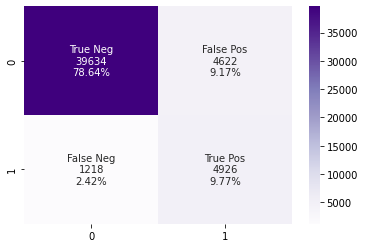

In [48]:
#Get the confusion matrix final model
cf_matrix_final = confusion_matrix(y_test, y_pred_rf)

group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix_final.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix_final.flatten()/np.sum(cf_matrix_final)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)

sns.heatmap(cf_matrix_final, annot=labels, fmt='', cmap='Purples')

In [49]:
#Random forest classifier
print(classification_report(y_test, y_pred_rf))

              precision    recall  f1-score   support

           0       0.97      0.90      0.93     44256
           1       0.52      0.80      0.63      6144

    accuracy                           0.88     50400
   macro avg       0.74      0.85      0.78     50400
weighted avg       0.91      0.88      0.89     50400



In [50]:
!pip install scikit-plot

0.9389534796482397


<Figure size 720x504 with 0 Axes>

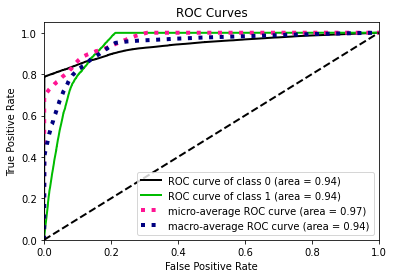

In [51]:
import scikitplot as skplt

# Compute ROC AUC Score
prediction_probability = rnd_clf.predict_proba(X_test)
print(roc_auc_score(y_test, prediction_probability[ : , 1]))


plt.figure(figsize=(10,7))
skplt.metrics.plot_roc_curve(y_test, prediction_probability )
plt.show()

# Neural Network

In [52]:
pip install --upgrade tensorflow

In [53]:
# NN
import tensorflow as tf

# data normalizer
normalizer1 = tf.keras.layers.Normalization(axis=-1)
normalizer1.adapt(X_train)

In [54]:
# Define Model's Architecture

def get_uncompiled_model_1():
  input_ = keras.layers.Input(shape=X_train.shape[1:])
  hidden1 = keras.layers.Dense(32, activation="relu")(input_)
  hidden2 = keras.layers.Dense(64, activation="relu")(hidden1)
  hidden3 = keras.layers.Dense(128, activation="relu")(hidden2)
  concat = keras.layers.concatenate([input_, hidden3])
  output = keras.layers.Dense(1)(concat)
  model = keras.models.Model(inputs=[input_], outputs=[output])
  return model


# Define Training Configuration (Optimizer, Loss, Metrics)
def get_compiled_model_1():
  model = get_uncompiled_model_1()
  model.compile(
        optimizer="adam",
        loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
        metrics=["accuracy"],
    )
  return model

In [55]:
from keras.callbacks import EarlyStopping
earlystop = EarlyStopping(monitor = 'loss',
                          min_delta = 2,
                          patience = 5,
                          verbose = 1,
                          restore_best_weights = True)

In [56]:
# Train Program
## First, let's create a training Dataset instance.
train_dataset_ = tf.data.Dataset.from_tensor_slices((X_train, y_train))

## Shuffle and slice train dataset.
train_dataset_ = train_dataset_.shuffle(buffer_size=1024).batch(5)

## Now we get a test dataset.
test_dataset_ = tf.data.Dataset.from_tensor_slices((X_test, y_test))
test_dataset_ = test_dataset_.batch(5)

## Call model to be compiled
model = get_compiled_model_1()

## Since the dataset already takes care of batching, we don't pass a `batch_size` argument.
model.fit(train_dataset_, epochs=5, callbacks=earlystop)

## Evaluate on a dataset.
print("\nEvaluate on test data")
result = model.evaluate(test_dataset_)
print('Test - Loss     : ', result[0])
print('Test - Accuracy : ', result[1])
print('')

Epoch 1/5
30240/30240 [==============================] - 146s 5ms/step - loss: 0.3744 - accuracy: 0.8771
Epoch 2/5
30240/30240 [==============================] - 115s 4ms/step - loss: 0.3698 - accuracy: 0.8771
Epoch 3/5
30240/30240 [==============================] - 115s 4ms/step - loss: 0.3667 - accuracy: 0.8771
Epoch 4/5
30240/30240 [==============================] - 115s 4ms/step - loss: 0.3637 - accuracy: 0.8772
Epoch 5/5
30240/30240 [==============================] - 115s 4ms/step - loss: 0.3611 - accuracy: 0.8774

Evaluate on test data
10080/10080 [==============================] - 28s 3ms/step - loss: 0.3612 - accuracy: 0.8783
Test - Loss     :  0.3611723780632019
Test - Accuracy :  0.878333330154419



### Model Evaluation

In [57]:
history = model.fit(X_train, y_train, epochs=5,
                    validation_data=(X_test, y_test),verbose=0)

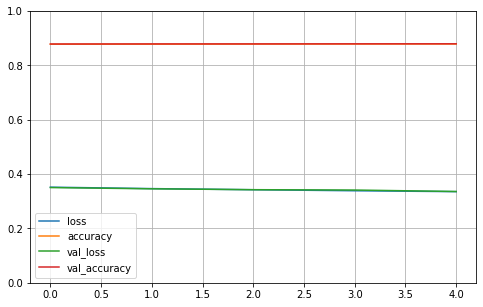

In [58]:
# Create plot of history model
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

## Summary EDA

1. The highest profession distribution is in the physician profession with a total of 5957. While the lowest is in the borrower with the Engineer profession with a total of 4048.

2. The highest was in the Physhian profession with a total of 5247 cases.

3. The age distribution of borrowers is very even. With a range between the ages of 20 - 80 years.

4. Those who default and do not default are the borrowers with the status of rented house ownership.

5. The cities that have the highest potential defaults are the cities of Kochi, Satna, Buxar, Srinagar, and Indore

6. The potential for cities that do not default are Vijayanagaram, Saharsa, Bulandshar, Bhopal and Vijawada.

I suggest the company to offer credit to several criteria for candidates who have the potential not to default, such as candidates with the profession of Physhian, with an age range of 20-80 years, and coming from the cities of Vijayanagaram, Saharsa, Bulanshar, Bhopal and Vijawada.

# Model Analysis

1. The model is built using 15 features obtained by the important features method using randomforest.

2. Scaling is done even though we use the randomforest algorithm. Randomforest should not be so affected by scaling. However, when run, it turns out that accuracy is better when scaling. I assume this is because the income column is very far from the other numeric columns.

3. Here I use randomforest, XGBoost, voting and bagging classifier. The algorithm is quite powerful for case classification. I had tried with logistic regression (a very simple algorithm) because of its simplicity so that the results were not good.

4. The highest result is Randomforest with 88% accuracy. But because here we want to focus on predicting the default case, I use recall accuracy. This is to minimize False Negative, where our model predicts that it is not the default when in fact it is the default.

5. False negative 2.39%. This is still quite high if the number of our borrowers is large. So it is necessary to improve the model.

6. Then I tried to use a neural network, the result was 87% but the model was overfitting. Where the model made is too focused on the training data used, this overfocus usually occurs because the model captures noise data that should be ignored.
So it is necessary to make improvements to the neural network.

Overall, it would be very helpful if we could have data on the number of ongoing loans for each borrower. Also the track record of NLP for each borrower. So the possibility of these features can help more in modeling.